## Attempts to detect contour and its orientation

Plan of action: Use orientation obtained from both the template and test image and find the relative difference

In [ ]:
pip install opencv-python

In [ ]:
pip install numpy

### Attempt 1 - Opencv function find contours

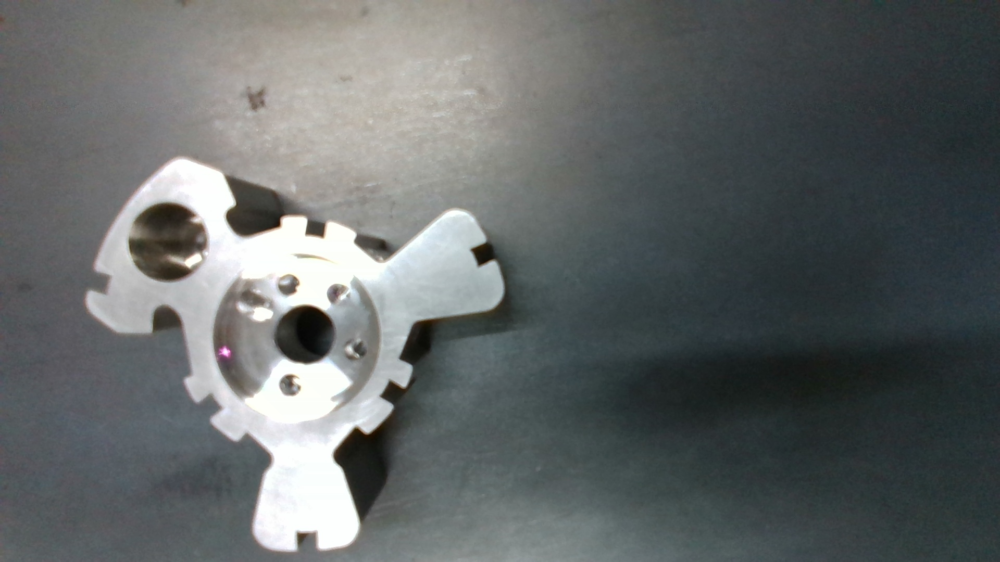

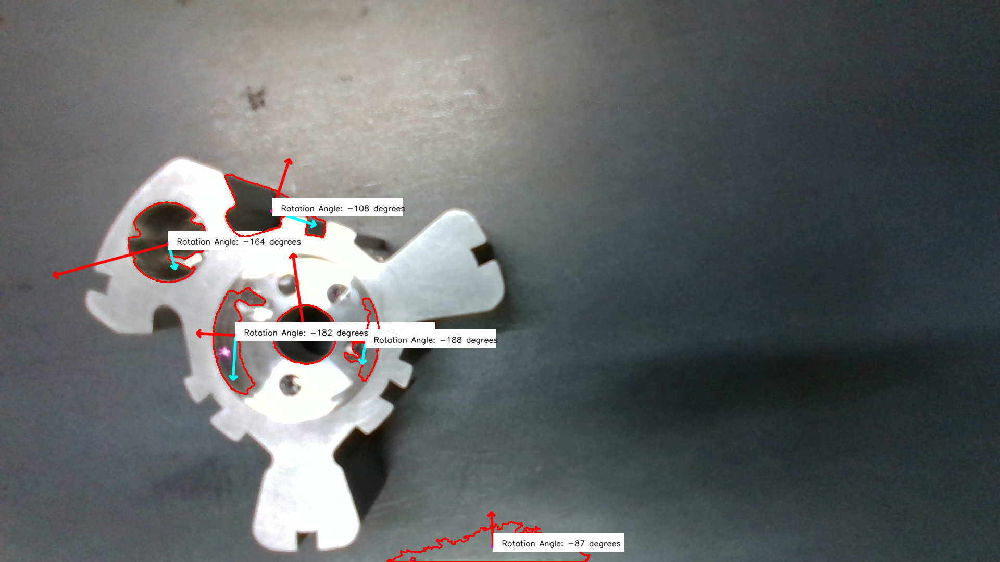

True

In [ ]:
import cv2 as cv
from math import atan2, cos, sin, sqrt, pi
import numpy as np
from google.colab.patches import cv2_imshow

def drawAxis(img, p_, q_, color, scale):
  p = list(p_)
  q = list(q_)

  ## [visualization1]
  angle = atan2(p[1] - q[1], p[0] - q[0]) # angle in radians
  hypotenuse = sqrt((p[1] - q[1]) * (p[1] - q[1]) + (p[0] - q[0]) * (p[0] - q[0]))

  # Here we lengthen the arrow by a factor of scale
  q[0] = p[0] - scale * hypotenuse * cos(angle)
  q[1] = p[1] - scale * hypotenuse * sin(angle)
  cv.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv.LINE_AA)

  # create the arrow hooks
  p[0] = q[0] + 9 * cos(angle + pi / 4)
  p[1] = q[1] + 9 * sin(angle + pi / 4)
  cv.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv.LINE_AA)

  p[0] = q[0] + 9 * cos(angle - pi / 4)
  p[1] = q[1] + 9 * sin(angle - pi / 4)
  cv.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv.LINE_AA)
  ## [visualization1]

def getOrientation(pts, img):
  ## [pca]
  # Construct a buffer used by the pca analysis
  sz = len(pts)
  data_pts = np.empty((sz, 2), dtype=np.float64)
  for i in range(data_pts.shape[0]):
    data_pts[i,0] = pts[i,0,0]
    data_pts[i,1] = pts[i,0,1]

  # Perform PCA analysis
  mean = np.empty((0))
  mean, eigenvectors, eigenvalues = cv.PCACompute2(data_pts, mean)

  # Store the center of the object
  cntr = (int(mean[0,0]), int(mean[0,1]))
  ## [pca]

  ## [visualization]
  # Draw the principal components
  cv.circle(img, cntr, 3, (255, 0, 255), 2)
  p1 = (cntr[0] + 0.02 * eigenvectors[0,0] * eigenvalues[0,0], cntr[1] + 0.02 * eigenvectors[0,1] * eigenvalues[0,0])
  p2 = (cntr[0] - 0.02 * eigenvectors[1,0] * eigenvalues[1,0], cntr[1] - 0.02 * eigenvectors[1,1] * eigenvalues[1,0])
  drawAxis(img, cntr, p1, (255, 255, 0), 1)
  drawAxis(img, cntr, p2, (0, 0, 255), 5)

  angle = atan2(eigenvectors[0,1], eigenvectors[0,0]) # orientation in radians
  ## [visualization]

  # Label with the rotation angle
  label = "  Rotation Angle: " + str(-int(np.rad2deg(angle)) - 90) + " degrees"
  textbox = cv.rectangle(img, (cntr[0], cntr[1]-25), (cntr[0] + 250, cntr[1] + 10), (255,255,255), -1)
  cv.putText(img, label, (cntr[0], cntr[1]), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 1, cv.LINE_AA)

  return angle

# Load the image
img = cv.imread("/content/input_img.jpg")

# Was the image there?
if img is None:
  print("Error: File not found")
  exit(0)

cv2_imshow(img)
#adding layer of hsv
#hsv_img = cv.cvtColor(img, cv.COLOR_BGR2HSV)

# Convert image to grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Convert image to binary
_, bw = cv.threshold(gray, 50, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)

# Find all the contours in the thresholded image
contours, _ = cv.findContours(bw, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)

for i, c in enumerate(contours):

  # Calculate the area of each contour
  area = cv.contourArea(c)

  # Ignore contours that are too small or too large
  if area < 3700 or 100000 < area:
    continue

  # Draw each contour only for visualisation purposes
  cv.drawContours(img, contours, i, (0, 0, 255), 2)

  # Find the orientation of each shape
  getOrientation(c, img)

cv2_imshow(img)
cv.waitKey(0)
cv.destroyAllWindows()

# Save the output image to the current directory
cv.imwrite("/content/output_img.jpg", img)

### issues encountered: brightness, reflection and shadows making it complicated to use one code for multiple images with different image composition.

# Approach 2 -same code with Canny Edge Detection - attempt to find the outermost countor

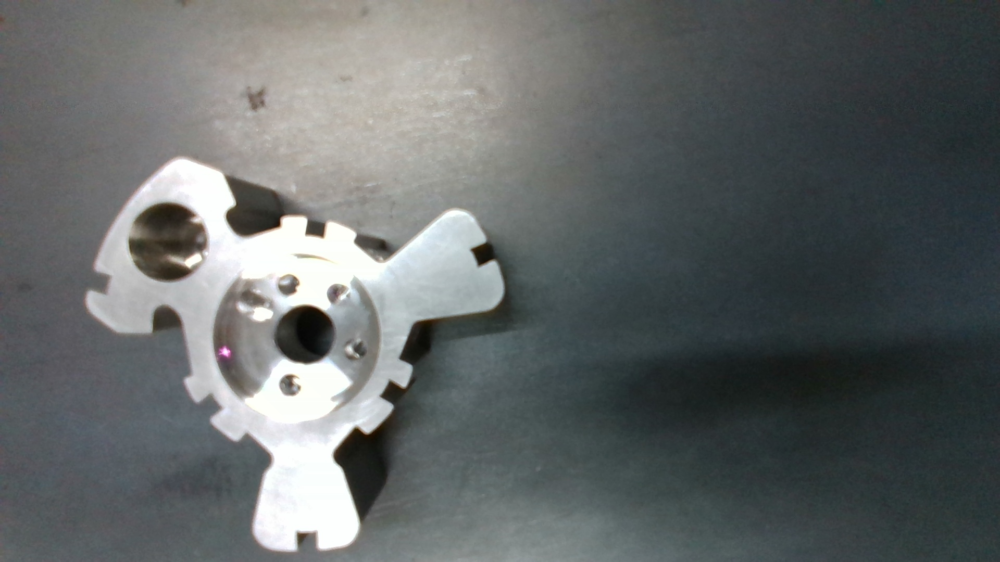

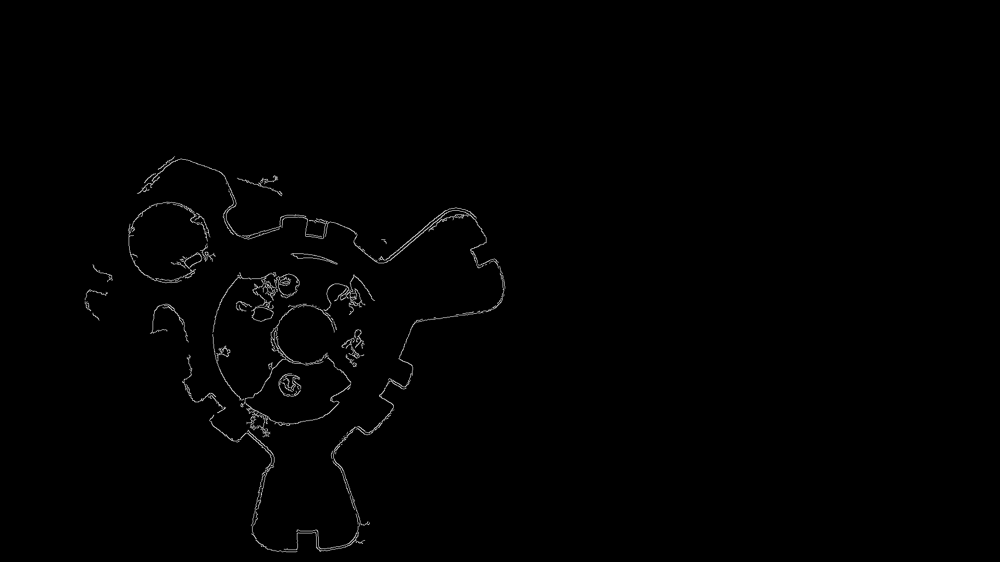

True

In [ ]:
import cv2 as cv
from math import atan2, cos, sin, sqrt, pi
import numpy as np
from google.colab.patches import cv2_imshow

def drawAxis(img, p_, q_, color, scale):
  p = list(p_)
  q = list(q_)

  ## [visualization1]
  angle = atan2(p[1] - q[1], p[0] - q[0]) # angle in radians
  hypotenuse = sqrt((p[1] - q[1]) * (p[1] - q[1]) + (p[0] - q[0]) * (p[0] - q[0]))

  # Here we lengthen the arrow by a factor of scale
  q[0] = p[0] - scale * hypotenuse * cos(angle)
  q[1] = p[1] - scale * hypotenuse * sin(angle)
  cv.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv.LINE_AA)

  # create the arrow hooks
  p[0] = q[0] + 9 * cos(angle + pi / 4)
  p[1] = q[1] + 9 * sin(angle + pi / 4)
  cv.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv.LINE_AA)

  p[0] = q[0] + 9 * cos(angle - pi / 4)
  p[1] = q[1] + 9 * sin(angle - pi / 4)
  cv.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv.LINE_AA)
  ## [visualization1]

def getOrientation(pts, img):
  ## [pca]
  # Construct a buffer used by the pca analysis
  sz = len(pts)
  data_pts = np.empty((sz, 2), dtype=np.float64)
  for i in range(data_pts.shape[0]):
    data_pts[i,0] = pts[i,0,0]
    data_pts[i,1] = pts[i,0,1]

  # Perform PCA analysis
  mean = np.empty((0))
  mean, eigenvectors, eigenvalues = cv.PCACompute2(data_pts, mean)

  # Store the center of the object
  cntr = (int(mean[0,0]), int(mean[0,1]))
  ## [pca]

  ## [visualization]
  # Draw the principal components
  cv.circle(img, cntr, 3, (255, 0, 255), 2)
  p1 = (cntr[0] + 0.02 * eigenvectors[0,0] * eigenvalues[0,0], cntr[1] + 0.02 * eigenvectors[0,1] * eigenvalues[0,0])
  p2 = (cntr[0] - 0.02 * eigenvectors[1,0] * eigenvalues[1,0], cntr[1] - 0.02 * eigenvectors[1,1] * eigenvalues[1,0])
  drawAxis(img, cntr, p1, (255, 255, 0), 1)
  drawAxis(img, cntr, p2, (0, 0, 255), 5)

  angle = atan2(eigenvectors[0,1], eigenvectors[0,0]) # orientation in radians
  ## [visualization]

  # Label with the rotation angle
  label = "  Rotation Angle: " + str(-int(np.rad2deg(angle)) - 90) + " degrees"
  textbox = cv.rectangle(img, (cntr[0], cntr[1]-25), (cntr[0] + 250, cntr[1] + 10), (255,255,255), -1)
  cv.putText(img, label, (cntr[0], cntr[1]), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 1, cv.LINE_AA)

  return angle

# Load the image
img = cv.imread("/content/input_img.jpg")

# Was the image there?
if img is None:
  print("Error: File not found")
  exit(0)

cv2_imshow(img)
#adding layer of hsv
#hsv_img = cv.cvtColor(img, cv.COLOR_BGR2HSV)

# Convert image to grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
canny = cv.Canny(gray,0,200)


cv2_imshow(canny)
cv.waitKey(0)
cv.destroyAllWindows()

# Save the output image to the current directory
cv.imwrite("/content/output_img.jpg", img)

tried and tested various limits of threshold to include the upper left outer edge of the gear - unsuccessful

### Approach 3- Use of Histogram Equalization to normalize the extreme values

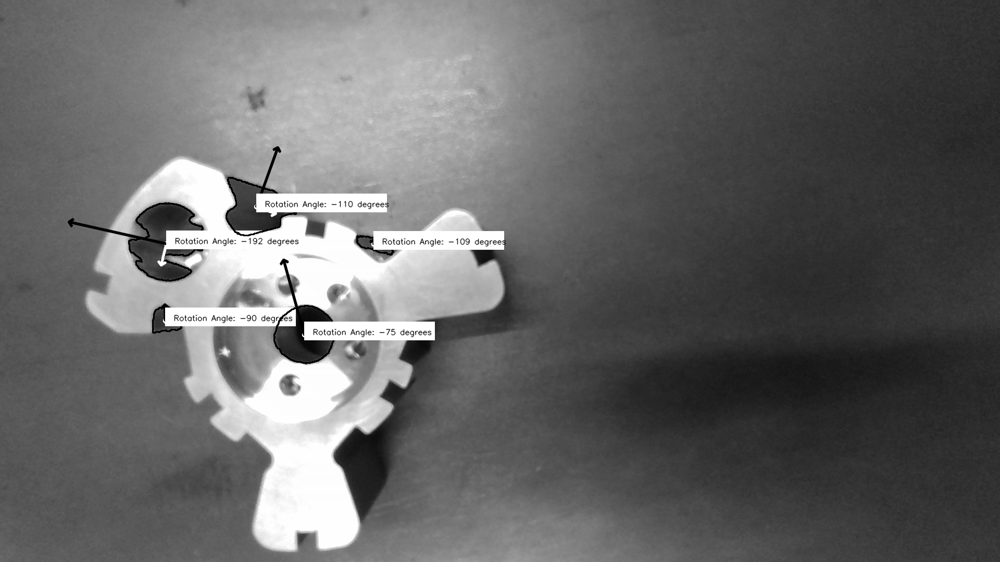

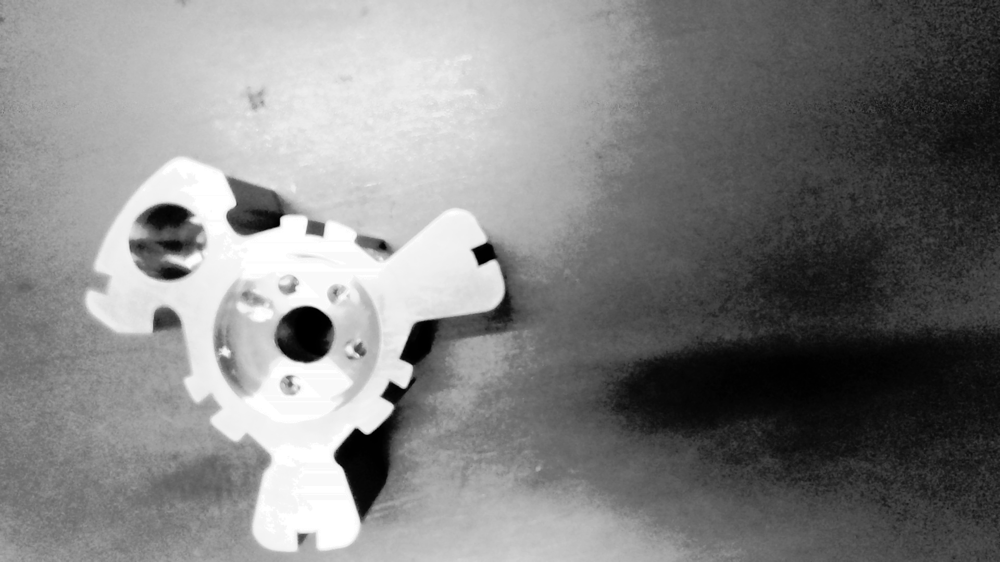

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the grayscale image (replace 'image.jpg' with your image file)
img = cv2.imread('/content/input_img.jpg', 0)

# Perform histogram equalization
equ = cv2.equalizeHist(img)
#gray = cv.cvtColor(equ, cv.COLOR_BGR2GRAY)


# Display the original and equalized images
#plt.subplot(121), plt.imshow(img, cmap='gray'), plt.title('Original Image')
#plt.subplot(122), plt.imshow(equ, cmap='gray'), plt.title('Equalized Image')
#plt.show()

# Convert image to binary
_, bw = cv.threshold(equ, 50, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)

# Find all the contours in the thresholded image
contours, _ = cv.findContours(bw, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)

for i, c in enumerate(contours):

  # Calculate the area of each contour
  area = cv.contourArea(c)

  # Ignore contours that are too small or too large
  if area < 1000 or 100000 < area:
    continue

  # Draw each contour only for visualisation purposes
  cv.drawContours(img, contours, i, (0, 0, 255), 2)

  # Find the orientation of each shape
  getOrientation(c, img)

cv2_imshow(img)
cv.waitKey(0)
cv.destroyAllWindows()

cv2_imshow(equ)
cv.waitKey(0)
cv.destroyAllWindows()

# Optionally, save the equalized image
#cv2.imwrite('equalized_image.jpg', equ)


unsuccessful in determing the outer contour even after normalization due to blurry edges or absence of the sharp edges.

### Attempt 4 : Let's try adaptive thresholding as edges are blurry and the surface is reflective

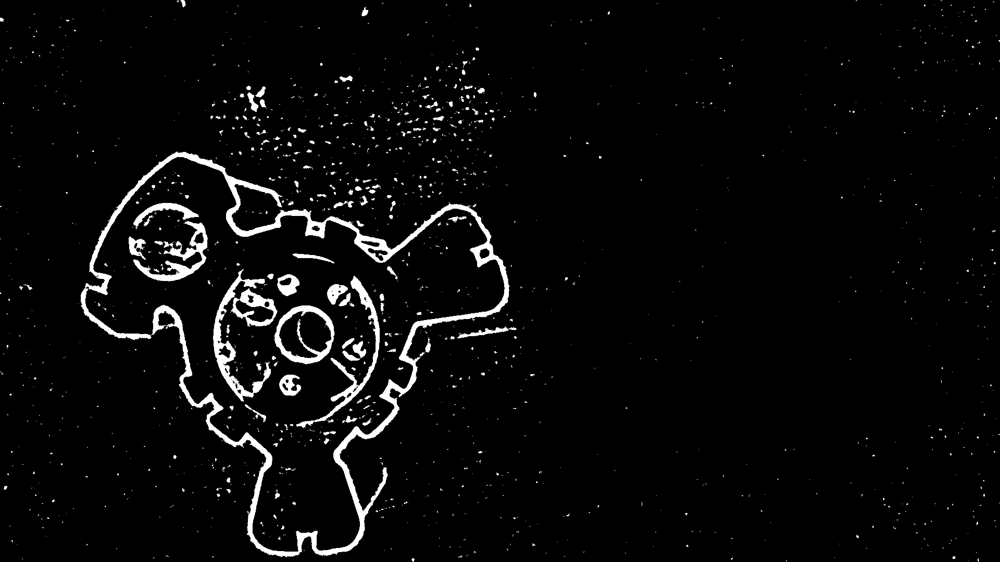

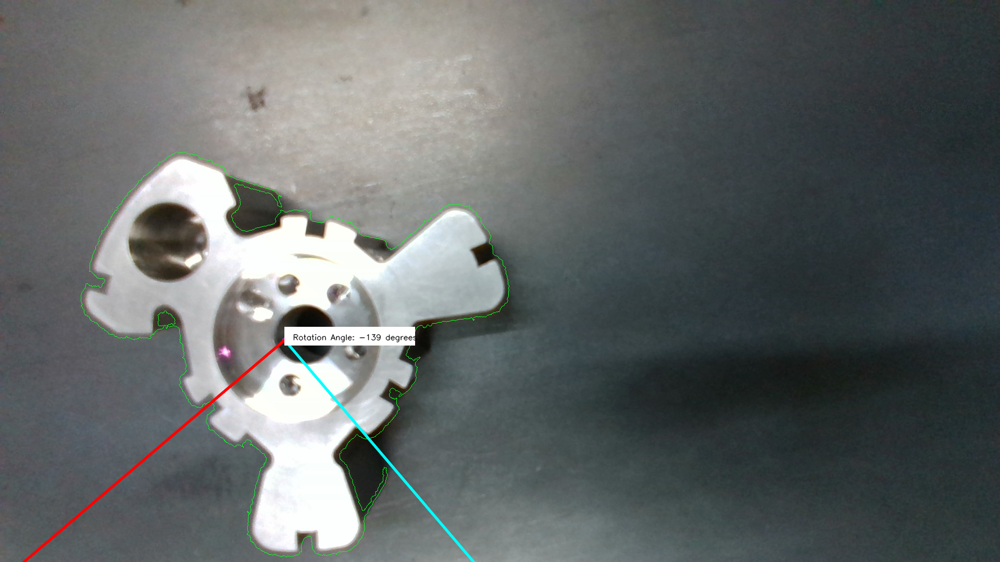

True

In [ ]:
import cv2 as cv
from math import atan2, cos, sin, sqrt, pi
import numpy as np
from google.colab.patches import cv2_imshow

def drawAxis(img, p_, q_, color, scale):
  p = list(p_)
  q = list(q_)

  ## [visualization1]
  angle = atan2(p[1] - q[1], p[0] - q[0]) # angle in radians
  hypotenuse = sqrt((p[1] - q[1]) * (p[1] - q[1]) + (p[0] - q[0]) * (p[0] - q[0]))

  # Here we lengthen the arrow by a factor of scale
  q[0] = p[0] - scale * hypotenuse * cos(angle)
  q[1] = p[1] - scale * hypotenuse * sin(angle)
  cv.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv.LINE_AA)

  # create the arrow hooks
  p[0] = q[0] + 9 * cos(angle + pi / 4)
  p[1] = q[1] + 9 * sin(angle + pi / 4)
  cv.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv.LINE_AA)

  p[0] = q[0] + 9 * cos(angle - pi / 4)
  p[1] = q[1] + 9 * sin(angle - pi / 4)
  cv.line(img, (int(p[0]), int(p[1])), (int(q[0]), int(q[1])), color, 3, cv.LINE_AA)
  ## [visualization1]

def getOrientation(pts, img):
  ## [pca]
  # Construct a buffer used by the pca analysis
  sz = len(pts)
  data_pts = np.empty((sz, 2), dtype=np.float64)
  for i in range(data_pts.shape[0]):
    data_pts[i,0] = pts[i,0,0]
    data_pts[i,1] = pts[i,0,1]

  # Perform PCA analysis
  mean = np.empty((0))
  mean, eigenvectors, eigenvalues = cv.PCACompute2(data_pts, mean)

  # Store the center of the object
  cntr = (int(mean[0,0]), int(mean[0,1]))
  ## [pca]

  ## [visualization]
  # Draw the principal components
  cv.circle(img, cntr, 3, (255, 0, 255), 2)
  p1 = (cntr[0] + 0.02 * eigenvectors[0,0] * eigenvalues[0,0], cntr[1] + 0.02 * eigenvectors[0,1] * eigenvalues[0,0])
  p2 = (cntr[0] - 0.02 * eigenvectors[1,0] * eigenvalues[1,0], cntr[1] - 0.02 * eigenvectors[1,1] * eigenvalues[1,0])
  drawAxis(img, cntr, p1, (255, 255, 0), 1)
  drawAxis(img, cntr, p2, (0, 0, 255), 5)

  angle = atan2(eigenvectors[0,1], eigenvectors[0,0]) # orientation in radians
  ## [visualization]

  # Label with the rotation angle
  label = "  Rotation Angle: " + str(-int(np.rad2deg(angle)) - 90) + " degrees"
  textbox = cv.rectangle(img, (cntr[0], cntr[1]-25), (cntr[0] + 250, cntr[1] + 10), (255,255,255), -1)
  cv.putText(img, label, (cntr[0], cntr[1]), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 1, cv.LINE_AA)

  return angle

# Load image, grayscale, Gaussian blur, Adaptive threshold
image = cv2.imread('/content/input_img.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (9,9), 0)
thresh = cv2.adaptiveThreshold(blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,23,3)

# Find contours and filter using contour area
cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)
    if area > 10000:
        cv2.drawContours(image, [c], -1, (36,255,12), 1)
        getOrientation(c, image)

cv2_imshow(thresh)
cv2_imshow(image)
cv2.waitKey(0)



# Save the output image to the current directory
cv.imwrite("/content/output_img.jpg", img)


### functional output. We can use template image and test image, find the diffrence of angles to obtain orientation

### Attempt 5 - Template Matching - with different type of gears available, template matching will help to determine the matched template area


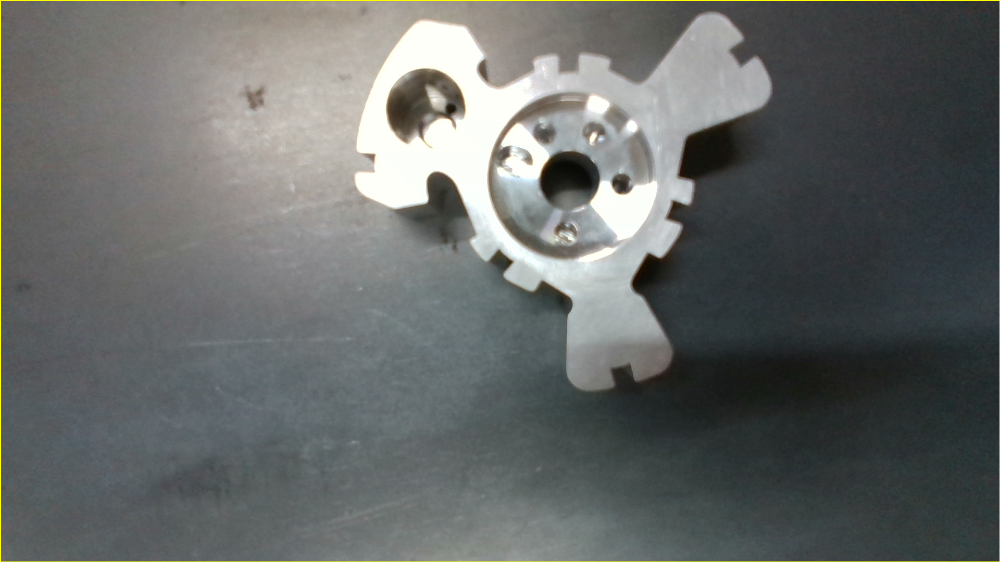

In [ ]:
# Python program to illustrate
# template matching
import cv2
import numpy as np

# Read the main image
img_rgb = cv2.imread('/content/test.jpg')

# Convert it to grayscale
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

# Read the template
template = cv2.imread('/content/input_img.jpg', 0)

# Store width and height of template in w and h
w, h = template.shape[::-1]

# Perform match operations.
res = cv2.matchTemplate(img_gray, template, cv2.TM_CCOEFF_NORMED)

# Specify a threshold
threshold = 0.5

# Store the coordinates of matched area in a numpy array
loc = np.where(res >= threshold)

# Draw a rectangle around the matched region.
for pt in zip(*loc[::-1]):
	cv2.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0, 255, 255), 2)

# Show the final image with the matched area.
cv2_imshow( img_rgb)


in this case, there is a need for custom mask preparation for improved performance

### Attempt 6 - Use ORB - open source alternative of SIFT and SURF

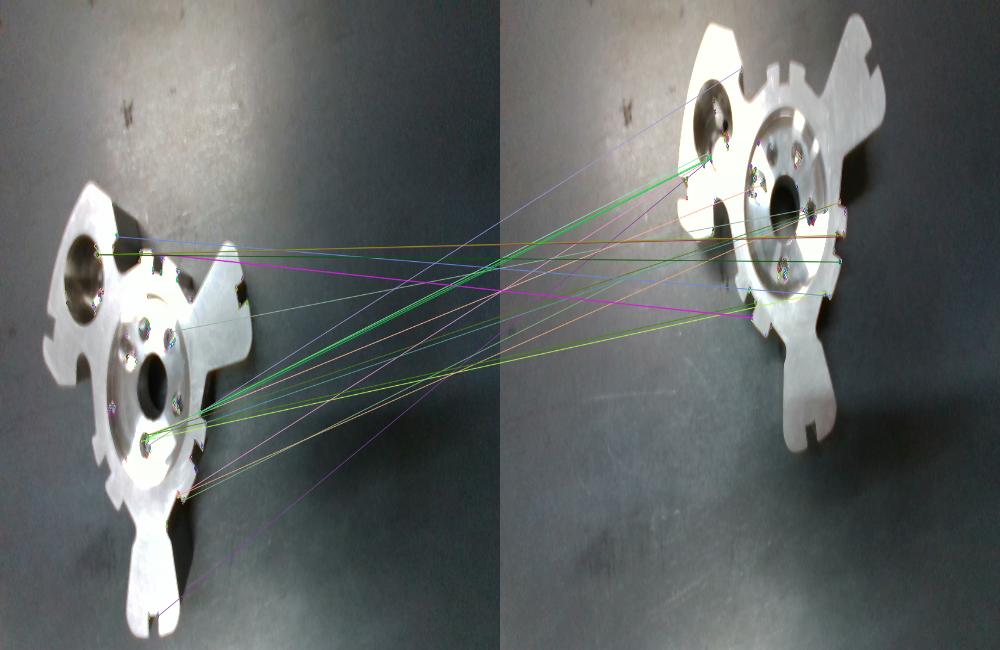

-1

In [ ]:
import numpy as np
import cv2


# Read the query image as query_img
# and train image This query image
# is what you need to find in train image
# Save it in the same directory
# with the name image.jpg
query_img = cv2.imread('/content/input_img.jpg')
train_img = cv2.imread('/content/test.jpg')

# Convert it to grayscale
query_img_bw = cv2.cvtColor(query_img,cv2.COLOR_BGR2GRAY)
train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)

# Initialize the ORB detector algorithm
orb = cv2.ORB_create()

# Now detect the keypoints and compute
# the descriptors for the query image
# and train image
queryKeypoints, queryDescriptors = orb.detectAndCompute(query_img_bw,None)
trainKeypoints, trainDescriptors = orb.detectAndCompute(train_img_bw,None)

# Initialize the Matcher for matching
# the keypoints and then match the
# keypoints
matcher = cv2.BFMatcher()
matches = matcher.match(queryDescriptors,trainDescriptors)

# draw the matches to the final image
# containing both the images the drawMatches()
# function takes both images and keypoints
# and outputs the matched query image with
# its train image
final_img = cv2.drawMatches(query_img, queryKeypoints,
train_img, trainKeypoints, matches[:20],None)

final_img = cv2.resize(final_img, (1000,650))

# Show the final image
cv2_imshow( final_img)
cv2.waitKey(3000)


feature matching fails as the features are not unique enough. Hence the key descriptors generated are mismatching the features in the image

### Attempt 7 - Using RANSAC

In [2]:
import cv2
import numpy as np
from skimage.feature import ORB, match_descriptors

# Load images
template_image = cv2.imread('template.jpg', 0)
test_image = cv2.imread('test.jpg', 0)

# Detect and compute keypoints and descriptors
orb = ORB(n_keypoints=1000)
orb.detect_and_extract(template_image)
keypoints1, descriptors1 = orb.keypoints, orb.descriptors

orb.detect_and_extract(test_image)
keypoints2, descriptors2 = orb.keypoints, orb.descriptors

# Match descriptors
matches = match_descriptors(descriptors1, descriptors2, cross_check=True)

# Extract matched keypoints
points1 = keypoints1[matches[:, 0]]
points2 = keypoints2[matches[:, 1]]

# Estimate homography
H, _ = cv2.findHomography(points1, points2, cv2.RANSAC)

# Decompose homography to get rotation and other components
num_solutions, rotations, translations, normals = cv2.decomposeHomographyMat(H, np.eye(3))

# Calculate rotation angle from the first rotation matrix (you might need to handle multiple solutions)
rotation_matrix = rotations[0]
rotation_angle_rad = np.arctan2(rotation_matrix[1, 0], rotation_matrix[0, 0])
rotation_angle_deg = np.degrees(rotation_angle_rad)

print(f'Rotation Angle: {rotation_angle_deg:.2f} degrees')


Rotation Angle: 124.22 degrees


Rotation Angle: 124.22 degrees


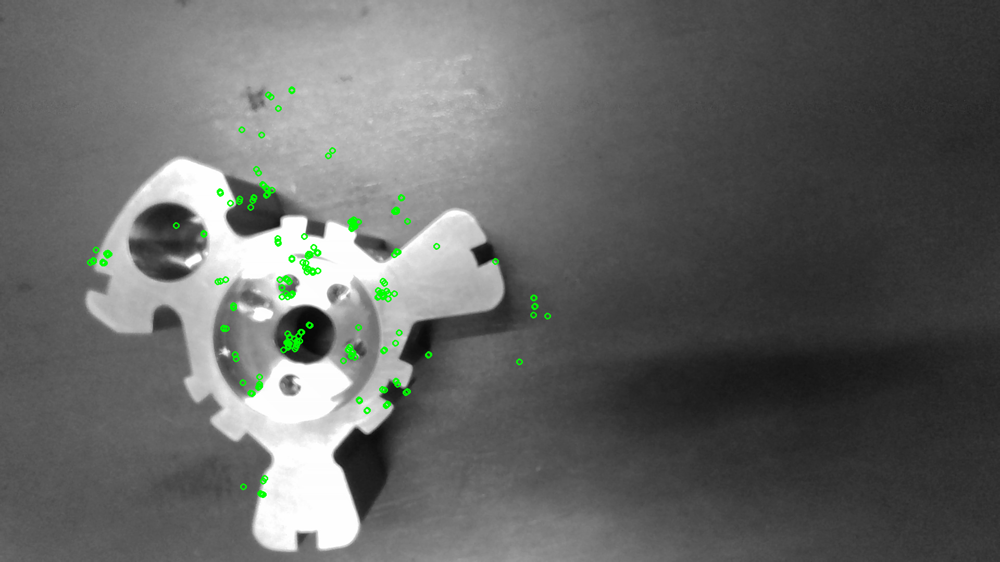

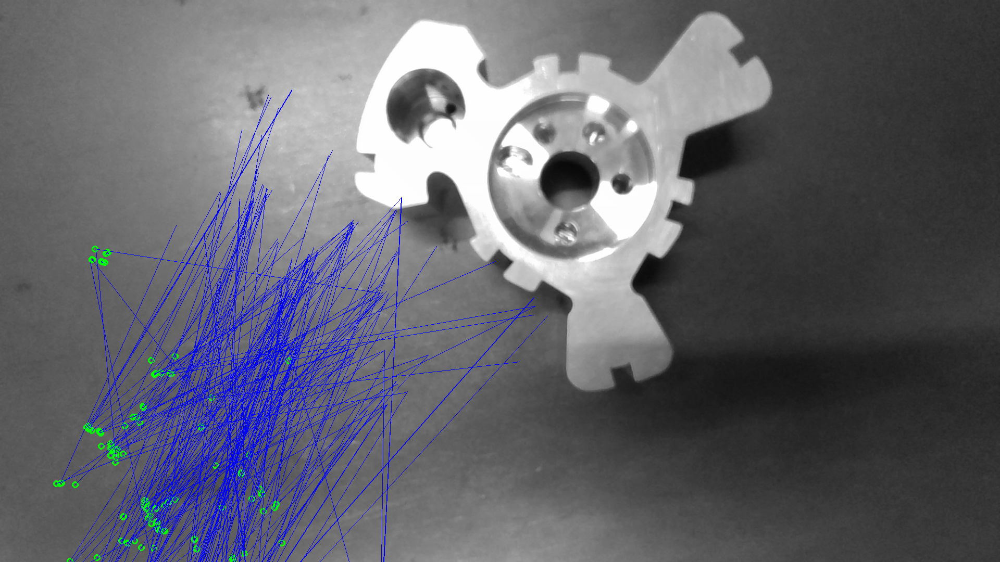

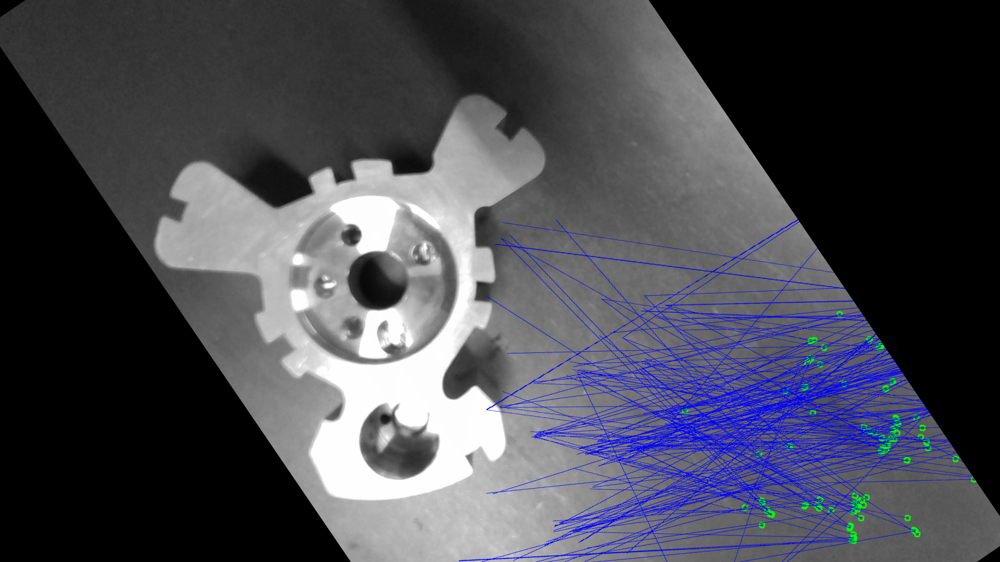

In [5]:
import cv2
import numpy as np
from skimage.feature import ORB, match_descriptors
from google.colab.patches import cv2_imshow

# Load images
template_image = cv2.imread('template.jpg', 0)
test_image = cv2.imread('test.jpg', 0)

# Detect and compute keypoints and descriptors
orb = ORB(n_keypoints=1000)
orb.detect_and_extract(template_image)
keypoints1, descriptors1 = orb.keypoints, orb.descriptors

orb.detect_and_extract(test_image)
keypoints2, descriptors2 = orb.keypoints, orb.descriptors

# Match descriptors
matches = match_descriptors(descriptors1, descriptors2, cross_check=True)

# Extract matched keypoints
points1 = keypoints1[matches[:, 0]]
points2 = keypoints2[matches[:, 1]]

# Estimate homography
H, _ = cv2.findHomography(points1, points2, cv2.RANSAC)

# Decompose homography to get rotation and other components
num_solutions, rotations, translations, normals = cv2.decomposeHomographyMat(H, np.eye(3))

# Calculate rotation angle from the first rotation matrix (you might need to handle multiple solutions)
rotation_matrix = rotations[0]
rotation_angle_rad = np.arctan2(rotation_matrix[1, 0], rotation_matrix[0, 0])
rotation_angle_deg = np.degrees(rotation_angle_rad)

print(f'Rotation Angle: {rotation_angle_deg:.2f} degrees')

# Visualize results

# Convert keypoints to integer format for drawing
points1_int = np.round(points1).astype(int)
points2_int = np.round(points2).astype(int)

# Draw keypoints and matches on the images
template_image_color = cv2.cvtColor(template_image, cv2.COLOR_GRAY2BGR)
test_image_color = cv2.cvtColor(test_image, cv2.COLOR_GRAY2BGR)

for point in points1_int:
    cv2.circle(template_image_color, tuple(point), 5, (0, 255, 0), 2)
for point in points2_int:
    cv2.circle(test_image_color, tuple(point), 5, (0, 255, 0), 2)

# Draw matches
for pt1, pt2 in zip(points1_int, points2_int):
    cv2.line(test_image_color, tuple(pt1), tuple(pt2), (255, 0, 0), 1)

# Create an affine transformation matrix for the rotation
rows, cols = test_image.shape
center = (cols / 2, rows / 2)
M = cv2.getRotationMatrix2D(center, rotation_angle_deg, 1)

# Apply the rotation to the test image
rotated_test_image = cv2.warpAffine(test_image_color, M, (cols, rows))

# Display the images
cv2_imshow( template_image_color)
cv2_imshow( test_image_color)
cv2_imshow( rotated_test_image)

# Wait and close windows
cv2.waitKey(0)
cv2.destroyAllWindows()


Rotation Angle: 124.22 degrees


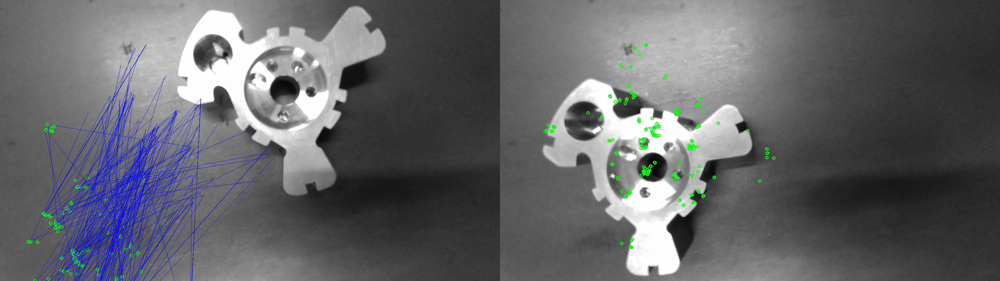

In [11]:
import cv2
import numpy as np
from skimage.feature import ORB, match_descriptors

# Load images
template_image = cv2.imread('template.jpg', 0)
test_image = cv2.imread('test.jpg', 0)

# Detect and compute keypoints and descriptors
orb = ORB(n_keypoints=1000)
orb.detect_and_extract(template_image)
keypoints1, descriptors1 = orb.keypoints, orb.descriptors

orb.detect_and_extract(test_image)
keypoints2, descriptors2 = orb.keypoints, orb.descriptors

# Match descriptors
matches = match_descriptors(descriptors1, descriptors2, cross_check=True)

# Extract matched keypoints
points1 = keypoints1[matches[:, 0]]
points2 = keypoints2[matches[:, 1]]

# Estimate homography
H, _ = cv2.findHomography(points1, points2, cv2.RANSAC)

# Decompose homography to get rotation and other components
num_solutions, rotations, translations, normals = cv2.decomposeHomographyMat(H, np.eye(3))

# Calculate rotation angle from the first rotation matrix
rotation_matrix = rotations[0]
rotation_angle_rad = np.arctan2(rotation_matrix[1, 0], rotation_matrix[0, 0])
rotation_angle_deg = np.degrees(rotation_angle_rad)

print(f'Rotation Angle: {rotation_angle_deg:.2f} degrees')

# Convert keypoints to integer format for drawing
points1_int = np.round(points1).astype(int)
points2_int = np.round(points2).astype(int)

# Draw keypoints and matches on the images
template_image_color = cv2.cvtColor(template_image, cv2.COLOR_GRAY2BGR)
test_image_color = cv2.cvtColor(test_image, cv2.COLOR_GRAY2BGR)

for point in points1_int:
    cv2.circle(template_image_color, tuple(point), 5, (0, 255, 0), 2)
for point in points2_int:
    cv2.circle(test_image_color, tuple(point), 5, (0, 255, 0), 2)

# Draw matches
for pt1, pt2 in zip(points1_int, points2_int):
    cv2.line(test_image_color, tuple(pt1), tuple(pt2), (255, 0, 0), 1)

# Create an affine transformation matrix for the rotation
rows, cols = test_image.shape
center = (cols / 2, rows / 2)
M = cv2.getRotationMatrix2D(center, rotation_angle_deg, 1)

# Apply the rotation to the test image
rotated_test_image = cv2.warpAffine(test_image_color, M, (cols, rows))

# Combine images side by side
combined_image = np.hstack((test_image_color,template_image_color))

# Display the collage
cv2_imshow( combined_image)

# Wait and close windows
cv2.waitKey(0)
cv2.destroyAllWindows()


key descriptors recognized are false positive. There is a strong need to manually determine the area of interest in the image just as Segment Anything(SAM) does.